In [3]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [4]:
!zip -r "/content/drive/MyDrive/dataset.zip" "/content/drive/MyDrive/dataset"


  adding: content/drive/MyDrive/dataset/ (stored 0%)
  adding: content/drive/MyDrive/dataset/val/ (stored 0%)
  adding: content/drive/MyDrive/dataset/val/class2/ (stored 0%)
  adding: content/drive/MyDrive/dataset/val/class2/Clean (162).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/val/class2/Clean (174).jpg (deflated 1%)
  adding: content/drive/MyDrive/dataset/val/class2/Clean (183).jpg (deflated 2%)
  adding: content/drive/MyDrive/dataset/val/class2/Clean (188).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/val/class2/Clean (189).jpg (deflated 1%)
  adding: content/drive/MyDrive/dataset/val/class2/Clean (176).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/val/class2/Clean (181).jpg (deflated 1%)
  adding: content/drive/MyDrive/dataset/val/class2/Clean (186).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/val/class2/Clean (190).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/val/class2/Clean (187).jpg (deflated 0%)
  adding: conten

In [5]:
import zipfile
import os

# Path to your .zip file in Google Drive
zip_path = "/content/drive/MyDrive/dataset.zip"

# Folder to extract to
extract_path = "/content/dataset"

# Unzip the file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("✅ Unzipped to:", extract_path)


✅ Unzipped to: /content/dataset


In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
import os

In [7]:
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

In [9]:
data_dir = '/content/dataset/content/drive/MyDrive/dataset'

# Create data loaders
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['train', 'val']}
#image_datasets

In [10]:
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4, shuffle=True, num_workers=4) for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
print(dataset_sizes)

class_names = image_datasets['train'].classes
class_names

{'train': 581, 'val': 248}


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


['class1', 'class2', 'class3', 'class4', 'class5', 'class6']

In [11]:
# Load the pre-trained ResNet-18 model
model = models.resnet18(pretrained=True)

# Freeze all layers except the final classification layer
for name, param in model.named_parameters():
    if "fc" in name:  # Unfreeze the final classification layer
        param.requires_grad = True
    else:
        param.requires_grad = False

# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)  # Use all parameters


# Move the model to the GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = model.to(device)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 126MB/s]


In [12]:
# Training loop
num_epochs = 10
for epoch in range(num_epochs):
    for phase in ['train', 'val']:
        if phase == 'train':
            model.train()
        else:
            model.eval()

        running_loss = 0.0
        running_corrects = 0

        for inputs, labels in dataloaders[phase]:
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            with torch.set_grad_enabled(phase == 'train'):
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                if phase == 'train':
                    loss.backward()
                    optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / dataset_sizes[phase]
        epoch_acc = running_corrects.double() / dataset_sizes[phase]

        print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

print("Training complete!")

train Loss: 2.6953 Acc: 0.3167
val Loss: 1.5575 Acc: 0.5081
train Loss: 1.5402 Acc: 0.4613
val Loss: 1.5595 Acc: 0.5282
train Loss: 1.2530 Acc: 0.5697
val Loss: 1.2914 Acc: 0.6048
train Loss: 1.2362 Acc: 0.5731
val Loss: 0.9189 Acc: 0.7379
train Loss: 1.1487 Acc: 0.5800
val Loss: 0.9749 Acc: 0.6935
train Loss: 1.0430 Acc: 0.6231
val Loss: 0.9855 Acc: 0.7137
train Loss: 1.0434 Acc: 0.6248
val Loss: 1.1278 Acc: 0.6653
train Loss: 1.0710 Acc: 0.6454
val Loss: 0.7933 Acc: 0.7460
train Loss: 1.0515 Acc: 0.6179
val Loss: 0.7723 Acc: 0.7218
train Loss: 1.0307 Acc: 0.6403
val Loss: 0.7488 Acc: 0.7581
Training complete!


In [14]:
# Save the model
torch.save(model.state_dict(), 'solar_classification_model.pth')

Classification on Unseen Image

In [17]:
import torch
from torchvision import models, transforms
from PIL import Image

# Load the saved model
model = models.resnet18(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, 1000)  # Adjust to match the original model's output units
model.load_state_dict(torch.load('solar_classification_model.pth'))
model.eval()

# Create a new model with the correct final layer
new_model = models.resnet18(pretrained=True)
new_model.fc = nn.Linear(new_model.fc.in_features, 2)  # Adjust to match the desired output units

# Copy the weights and biases from the loaded model to the new model
new_model.fc.weight.data = model.fc.weight.data[0:2]  # Copy only the first 2 output units
new_model.fc.bias.data = model.fc.bias.data[0:2]

In [19]:
# Load and preprocess the unseen image
image_path = '/content/solar1.jpg'  # Replace with the path to your image
image = Image.open(image_path)
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
input_tensor = preprocess(image)
input_batch = input_tensor.unsqueeze(0)  # Add a batch dimension

In [20]:
# Load a pretrained model
model = models.resnet18(pretrained=True)
model.eval()

# Move to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
input_batch = input_batch.to(device)

# Predict
with torch.no_grad():
    output = model(input_batch)

# Get top prediction
_, predicted_class = torch.max(output, 1)
print(f"Predicted class index: {predicted_class.item()}")


Predicted class index: 807


In [21]:
import json
import urllib.request

# Download ImageNet class labels
url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
urllib.request.urlretrieve(url, "imagenet_classes.txt")

# Load class names
with open("imagenet_classes.txt") as f:
    classes = [line.strip() for line in f.readlines()]

print("Predicted class label:", classes[predicted_class.item()])


Predicted class label: solar dish


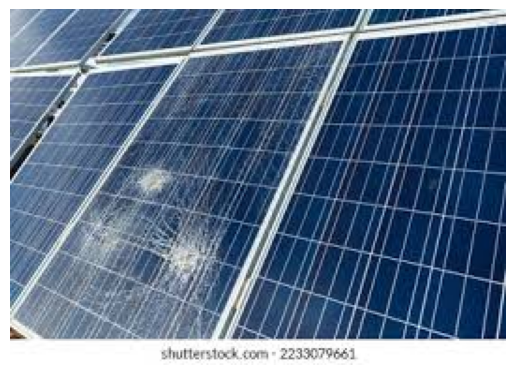

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Display the image with the predicted class name
image = np.array(image)
plt.imshow(image)
plt.axis('off')
#plt.text(10, 10, f'Predicted: {predicted_class_name}', fontsize=12, color='white', backgroundcolor='red')
plt.show()

In [25]:
!zip -r "/content/drive/MyDrive/panel test.zip" "/content/drive/MyDrive/panel test"


  adding: content/drive/MyDrive/panel test/ (stored 0%)
  adding: content/drive/MyDrive/panel test/Clean (156).jpg (deflated 0%)
  adding: content/drive/MyDrive/panel test/Clean (153).jpg (deflated 0%)
  adding: content/drive/MyDrive/panel test/Bird (167).JPG (deflated 11%)
  adding: content/drive/MyDrive/panel test/Bird (170).JPG (deflated 10%)
  adding: content/drive/MyDrive/panel test/Clean (154).jpg (deflated 0%)
  adding: content/drive/MyDrive/panel test/Clean (152).jpg (deflated 1%)
  adding: content/drive/MyDrive/panel test/Physical (50).jpg (deflated 0%)
  adding: content/drive/MyDrive/panel test/Bird (168).jpg (deflated 2%)
  adding: content/drive/MyDrive/panel test/Clean (151).jpg (deflated 0%)
  adding: content/drive/MyDrive/panel test/Bird (169).jpg (deflated 0%)
  adding: content/drive/MyDrive/panel test/Clean (155).jpg (deflated 0%)
  adding: content/drive/MyDrive/panel test/Bird (165).jpg (deflated 0%)
  adding: content/drive/MyDrive/panel test/Bird (163).jpg (deflated 1

In [26]:
import zipfile
import os

# Path to your .zip file in Google Drive
zip_path = "/content/drive/MyDrive/panel test.zip"

# Folder to extract to
extract_path = "/content/dataset"

# Unzip the file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("✅ Unzipped to:", extract_path)


✅ Unzipped to: /content/dataset


In [28]:
# Load and preprocess the unseen image
image_path = '/content/dataset/content/drive/MyDrive/panel test'  # Replace with the path to your image
image = Image.open(image_path)
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
input_tensor = preprocess(image)
input_batch = input_tensor.unsqueeze(0)  # Add a batch dimension

IsADirectoryError: [Errno 21] Is a directory: '/content/dataset/content/drive/MyDrive/panel test'

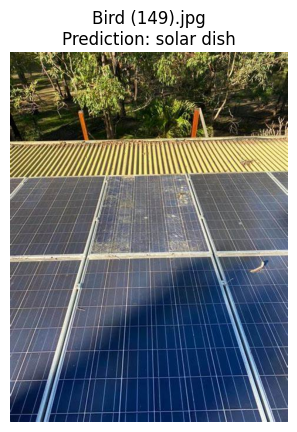

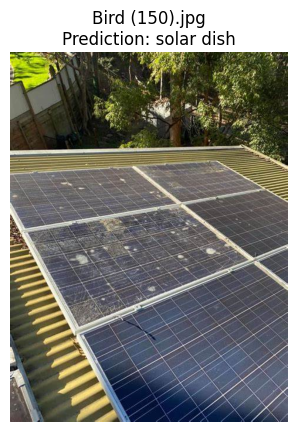

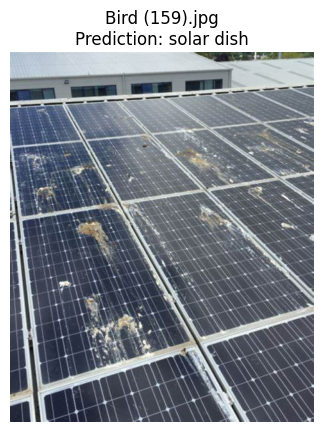

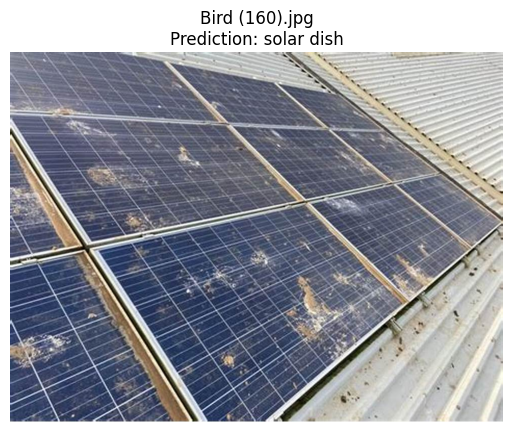

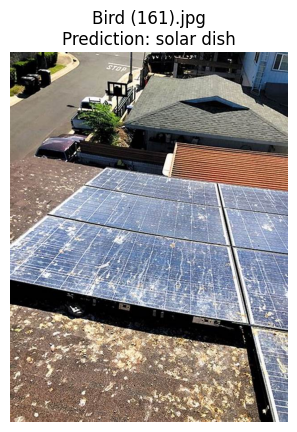

...

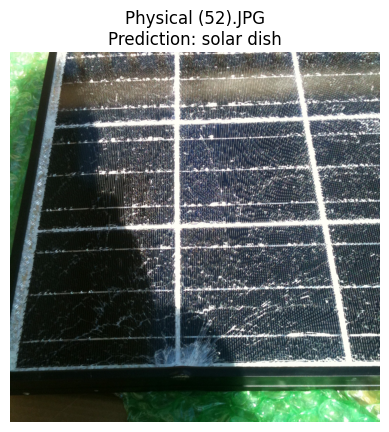

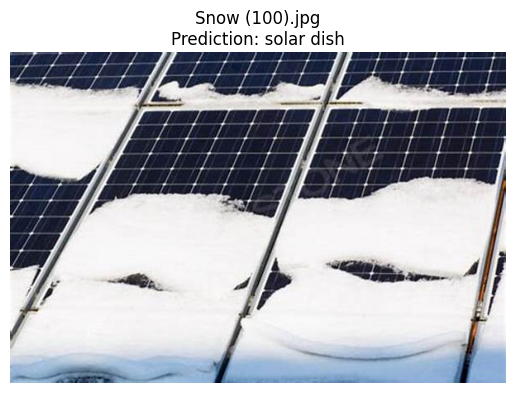

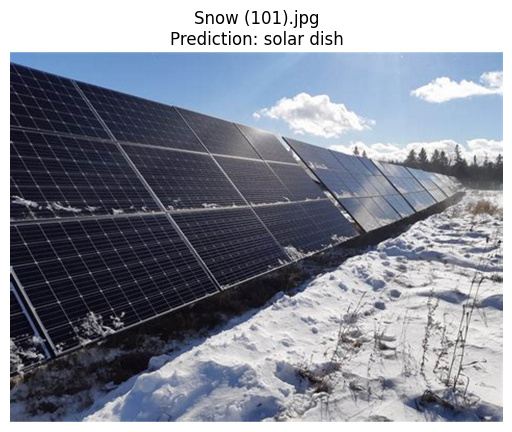

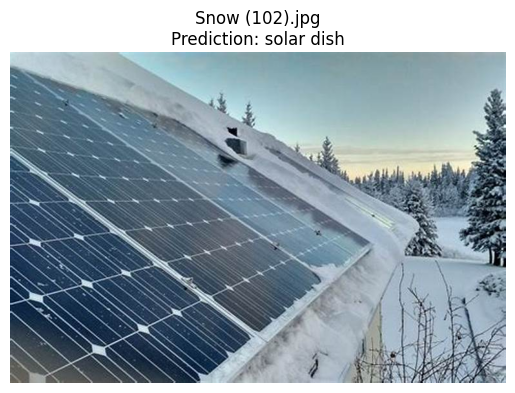

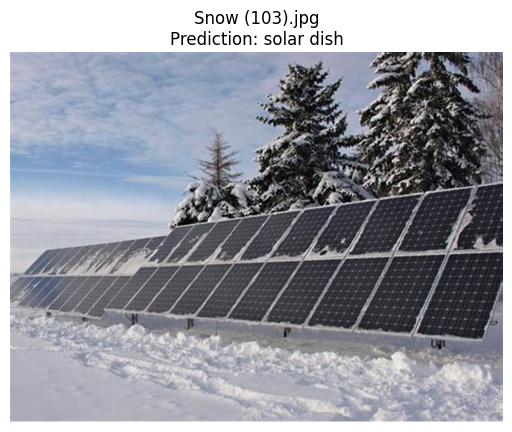

In [29]:
import os
from PIL import Image
import torch
from torchvision import models, transforms
import matplotlib.pyplot as plt
import urllib.request

# Folder containing test images
folder_path = "/content/drive/MyDrive/panel test"  # ✅ Replace with your folder

# 1. Define image preprocessing pipeline
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# 2. Load pretrained model
model = models.resnet18(pretrained=True)
model.eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# 3. Load ImageNet class labels
label_path = "imagenet_classes.txt"
if not os.path.exists(label_path):
    urllib.request.urlretrieve(
        "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt",
        label_path
    )

with open(label_path) as f:
    labels = [line.strip() for line in f.readlines()]

# 4. Loop through all images in the folder
image_files = sorted([f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])

if not image_files:
    print("❌ No image files found in the folder.")
else:
    for file in image_files:
        image_path = os.path.join(folder_path, file)
        image = Image.open(image_path).convert('RGB')

        # Preprocess and prepare batch
        input_tensor = preprocess(image)
        input_batch = input_tensor.unsqueeze(0).to(device)

        # Predict
        with torch.no_grad():
            output = model(input_batch)
        _, predicted_idx = torch.max(output, 1)
        predicted_label = labels[predicted_idx.item()]

        # Display image with predicted label
        plt.imshow(image)
        plt.title(f"{file}\nPrediction: {predicted_label}", fontsize=12)
        plt.axis('off')
        plt.show()
